In [1]:
## Import Packages
from __future__ import print_function

import numpy as np
import pandas as pd
from itertools import product

#Astro Software
import astropy.units as units
from astropy.coordinates import SkyCoord
from astropy.io import fits

#Plotting Packages
import matplotlib as mpl
import matplotlib.cm as cmplt
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import LogNorm
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns

from PIL import Image, ImageDraw

from yt.config import ytcfg
import yt
import yt.units as u

#Scattering NN
import torch
import torch.nn.functional as F
from torch import optim
from kymatio.torch import Scattering2D
device = "cpu"

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

import skimage
from skimage import filters
from skimage.filters import window

from scipy.optimize import curve_fit
from scipy import linalg
from scipy import stats
from scipy.signal import general_gaussian
from scipy.ndimage import map_coordinates

# from scipy.sparse import csr_matrix
from scipy.sparse import csc_matrix
from scipy.sparse.csgraph import reverse_cuthill_mckee

#I/O
import h5py
import pickle
import glob
import copy
import time
import os
#from bs4 import BeautifulSoup
import scipy.io as sio

#Plotting Style
%matplotlib inline
plt.style.use('dark_background')
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 20
rcParams['font.family'] = 'sans-serif'

#Threading
torch.set_num_threads=2
from multiprocessing import Pool

import ntpath
def path_leaf(path):
    head, tail = ntpath.split(path)
    out = os.path.splitext(tail)[0]
    return out

def hd5_open(file_name,name):
    f=h5py.File(file_name,'r', swmr=True)
    data = f[name][:]
    f.close()
    return data

from matplotlib.colors import LinearSegmentedColormap
cdict1 = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
blue_red1 = LinearSegmentedColormap('BlueRed1', cdict1,N=5000)

/opt/miniconda3/envs/IWST/lib/python3.8/_collections_abc.py:666: MatplotlibDeprecationWarning: The global colormaps dictionary is no longer considered public API.
  self[key]


In [2]:
mnist_DHC_out_rot7pi = hd5_open('../scratch_AKS/mnist_DHC_out_rot7pi_8.h5','main/data')
mnist_DHC_out_rot7pi_test = hd5_open('../scratch_AKS/mnist_DHC_out_rot7pi_8_test.h5','main/data')

mnist_DHC_out_rotpi_3 = hd5_open('../scratch_AKS/mnist_DHC_out_rotpi_3.h5','main/data')
mnist_DHC_out_rotpi_3_test = hd5_open('../scratch_AKS/mnist_DHC_out_rotpi_3_test.h5','main/data')

mnist_DHC_out_rot2pi_3 = hd5_open('../scratch_AKS/mnist_DHC_out_rot2pi_3.h5','main/data')
mnist_DHC_out_rot2pi_3_test = hd5_open('../scratch_AKS/mnist_DHC_out_rot2pi_3_test.h5','main/data')

mnist_DHC_out_rot3pi_3 = hd5_open('../scratch_AKS/mnist_DHC_out_rot3pi_3.h5','main/data')
mnist_DHC_out_rot3pi_3_test = hd5_open('../scratch_AKS/mnist_DHC_out_rot3pi_3_test.h5','main/data')

mnist_DHC_out_rot4pi_3 = hd5_open('../scratch_AKS/mnist_DHC_out_rot4pi_3.h5','main/data')
mnist_DHC_out_rot4pi_3_test = hd5_open('../scratch_AKS/mnist_DHC_out_rot4pi_3_test.h5','main/data')

mnist_DHC_out_rot5pi_3 = hd5_open('../scratch_AKS/mnist_DHC_out_rot5pi_3.h5','main/data')
mnist_DHC_out_rot5pi_3_test = hd5_open('../scratch_AKS/mnist_DHC_out_rot5pi_3_test.h5','main/data')

In [2]:
def DHC_iso(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,J*J*L),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [7]:
subtract = DHC_iso(mnist_DHC_out_rot7pi,6,8) - DHC_iso(mnist_DHC_out_rotpi_3,6,8)

In [10]:
np.std(subtract)

1.9670519000928232e-05

In [11]:
np.std(DHC_iso(mnist_DHC_out_rot7pi,6,8))

0.028479864234484613

In [12]:
subtract = DHC_iso(mnist_DHC_out_rot7pi,6,8) - DHC_iso(mnist_DHC_out_rot2pi_3,6,8)

In [13]:
np.std(subtract)

3.943980739534011e-05

In [4]:
mnist_DHC_out_angles = hd5_open('../from_cannon/2021_01_20/mnist_DHC_test_angles.h5','main/data')

In [73]:
mnist_DHC_out_angles.shape

(1000000, 2452)

In [16]:
mnist_DHC_out_angles_iso = DHC_iso(mnist_DHC_out_angles,6,8)

In [17]:
mnist_DHC_out_angles_iso[3,:].shape

(310,)

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

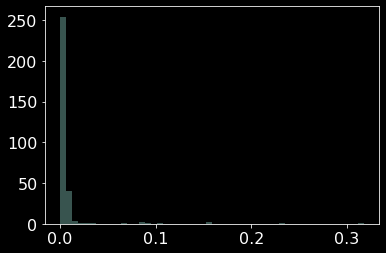

In [19]:
#Coeff Magnitude Distribution
sns.distplot(mnist_DHC_out_angles_iso[3,:],kde=False)

In [28]:
temp = np.array([[1,1,1,2,2,2,3,3,3,4,4,4],[1,2,3,4,5,6,7,8,9,11,12,13]]).T
temp

array([[ 1,  1],
       [ 1,  2],
       [ 1,  3],
       [ 2,  4],
       [ 2,  5],
       [ 2,  6],
       [ 3,  7],
       [ 3,  8],
       [ 3,  9],
       [ 4, 11],
       [ 4, 12],
       [ 4, 13]])

In [31]:
temp.reshape(4,3,2)

array([[[ 1,  1],
        [ 1,  2],
        [ 1,  3]],

       [[ 2,  4],
        [ 2,  5],
        [ 2,  6]],

       [[ 3,  7],
        [ 3,  8],
        [ 3,  9]],

       [[ 4, 11],
        [ 4, 12],
        [ 4, 13]]])

In [32]:
mnist_DHC_out_angles_iso_reshape = mnist_DHC_out_angles_iso.reshape(10000,100,310)

In [33]:
mnist_DHC_out_angles_iso_reshape

(10000, 100, 310)

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

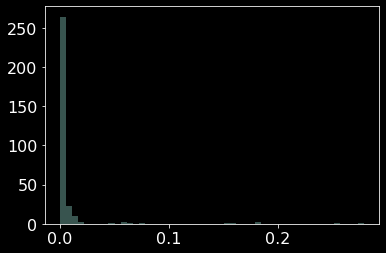

In [36]:
#Coeff Magnitude Distribution
sns.distplot(mnist_DHC_out_angles_iso_reshape[3,0,:],kde=False)

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

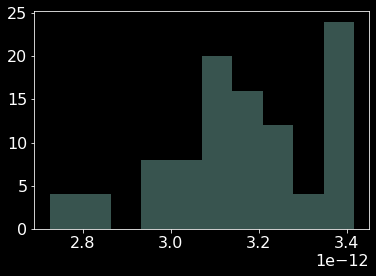

In [43]:
#Angular Distribution for a Coeff
sns.distplot(mnist_DHC_out_angles_iso_reshape[3,:,50],kde=False)

In [47]:
angles_std = np.std(mnist_DHC_out_angles_iso_reshape,axis=1)

In [48]:
angles_std.shape

(10000, 310)

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

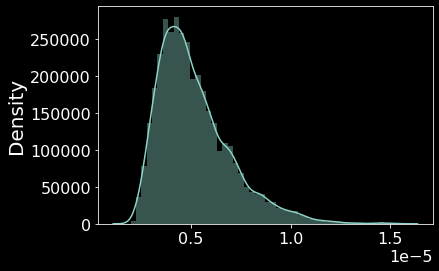

In [52]:
sns.distplot(angles_std[:,7])

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

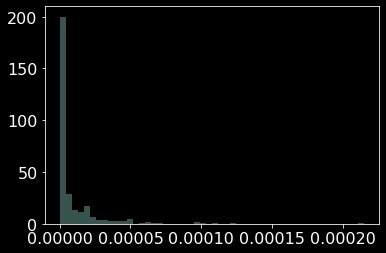

In [54]:
sns.distplot(angles_std[7,:],kde=False)

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

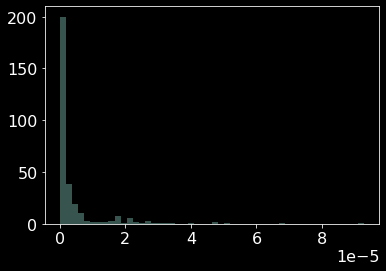

In [55]:
sns.distplot(angles_std[200,:],kde=False)

In [56]:
np.mean(angles_std)

7.99445242119837e-06

In [57]:
from statsmodels.stats.weightstats import DescrStatsW

In [71]:
std_dev_weighted = np.zeros((10000,310))
for i in range(10000):
    for j in range(310):
        weighted_stats = DescrStatsW(mnist_DHC_out_angles_iso_reshape[i,:,j], weights=100*mnist_DHC_out_angles_iso_reshape[i,:,j]/np.sum(mnist_DHC_out_angles_iso_reshape[i,:,j]), ddof=0)
        std_dev_weighted[i,j] = weighted_stats.std

/opt/miniconda3/envs/IWST/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

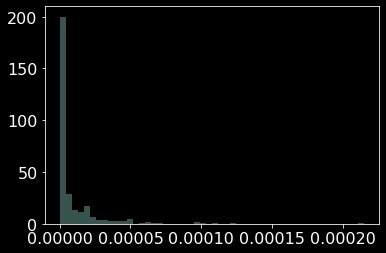

In [65]:
sns.distplot(std_dev_weighted[7,:],kde=False)

<AxesSubplot:>

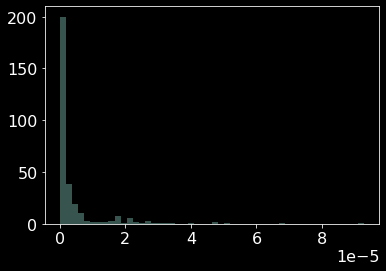

In [66]:
sns.distplot(std_dev_weighted[200,:],kde=False)

In [67]:
std_dev_weighted.shape

(10000, 310)

In [72]:
np.mean(std_dev_weighted)

7.996015431550575e-06

In [4]:
def prec_LDA(lda,X_test,y_test):
    y_pred = lda.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    return prec

Trade-off Workflow

In [3]:
mnist_train_y = hd5_open('../scratch_AKS/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../scratch_AKS/mnist_test_y.h5','main/data')

In [7]:
M = 100
angles = [i for i in np.linspace(0,2,100)]

In [98]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_21/mnist_DHC_train_ang_0_1.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_21/mnist_DHC_test_ang_0_1.h5','main/data')
mnist_DHC_out_sizetest.shape

(1000000, 1124)

In [87]:
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,4,8)
mnist_DHC_out_size_iso.shape

(1000000, 144)

In [88]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,144)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

0.00016346468159089843

In [99]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,4,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],4,8),mnist_test_y))

In [101]:
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(84.7791, 0.6191996366277988)

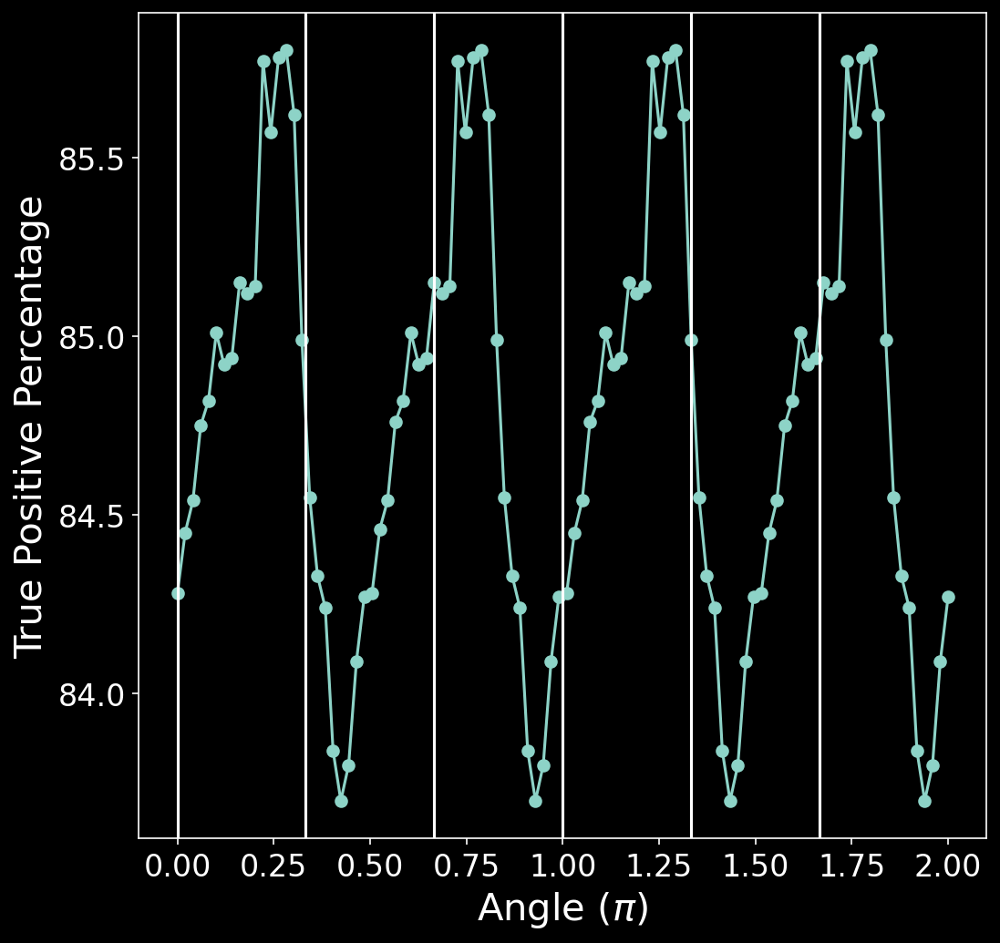

In [102]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [103]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_21/mnist_DHC_train_ang_0_0.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_21/mnist_DHC_test_ang_0_0.h5','main/data')
mnist_DHC_out_sizetest.shape

(1000000, 652)

In [104]:
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,3,8)
mnist_DHC_out_size_iso.shape

(1000000, 85)

In [105]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,85)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

0.0002796741184842396

In [106]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,3,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],3,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(83.62440000000001, 0.6354908653946181)

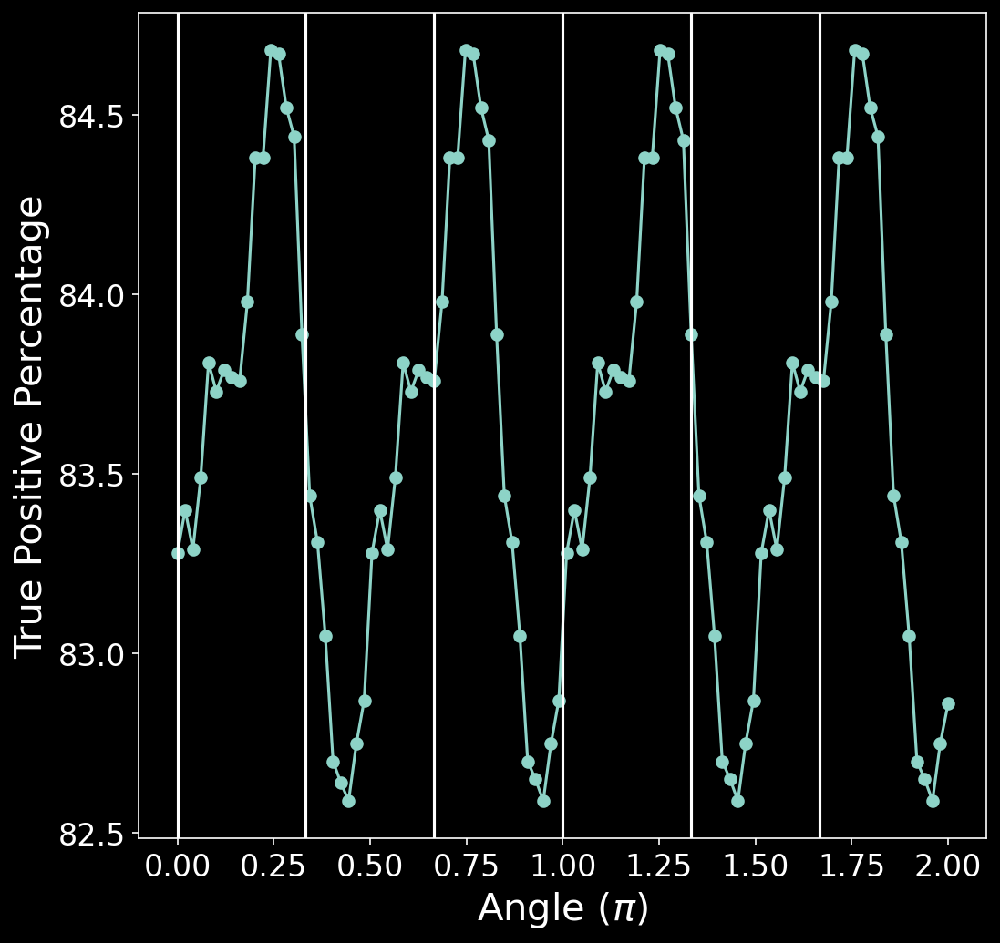

In [107]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [108]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_21/mnist_DHC_train_ang_1_0.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_21/mnist_DHC_test_ang_1_0.h5','main/data')
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,4,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_sizetest.shape

((1000000, 144), (1000000, 1124))

In [109]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,144)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

4.838224568129814e-05

In [111]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,4,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],4,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(90.4641, 0.20655311665525808)

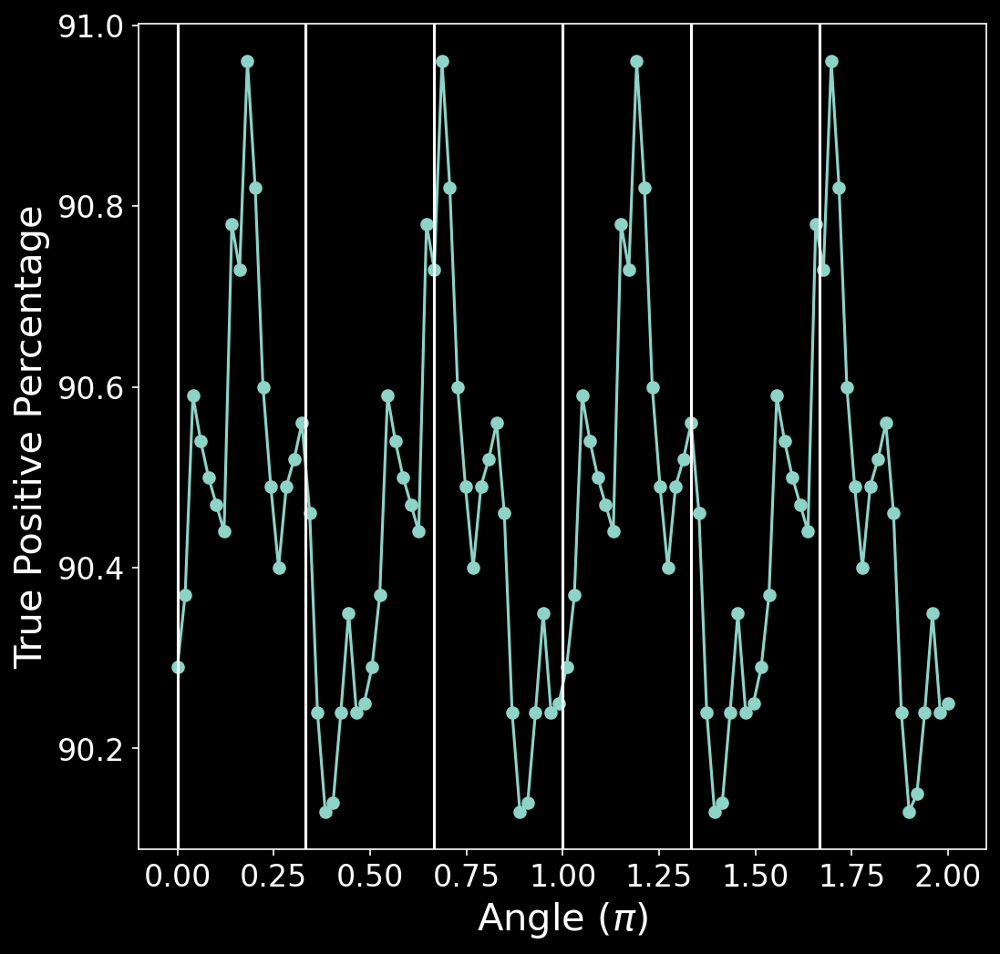

In [112]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [34]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_21/mnist_DHC_train_ang_1_1.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_21/mnist_DHC_test_ang_1_1.h5','main/data')
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,5,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_sizetest.shape

((1000000, 219), (1000000, 1724))

In [35]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,219)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

2.8541844710164978e-05

In [37]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,5,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],5,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(91.0355, 0.15646325447209622)

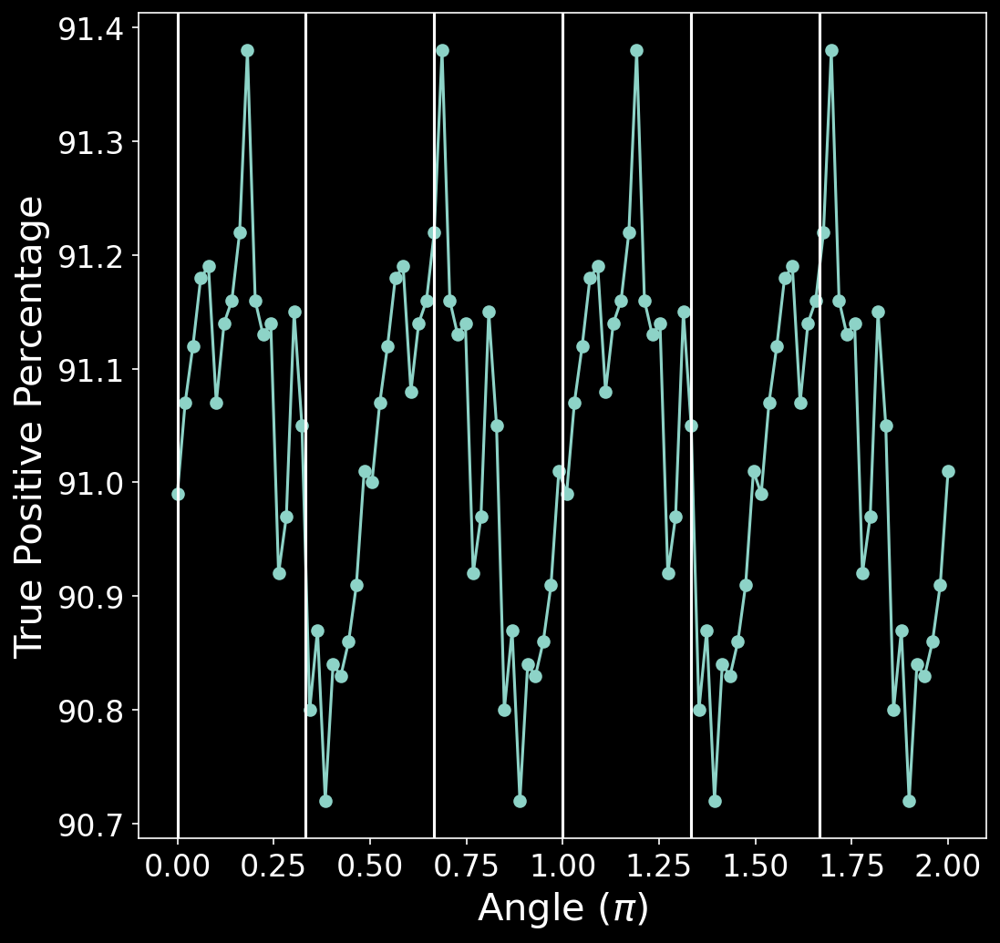

In [38]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [58]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_21/mnist_DHC_train_ang_2_0.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_21/mnist_DHC_test_ang_2_0.h5','main/data')
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,5,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_sizetest.shape

((1000000, 219), (1000000, 1724))

In [60]:
mnist_DHC_out_sizetrain.shape

(360000, 1724)

In [61]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,219)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

1.594175523216006e-05

In [62]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,5,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],5,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(91.61399999999999, 0.116558997936667)

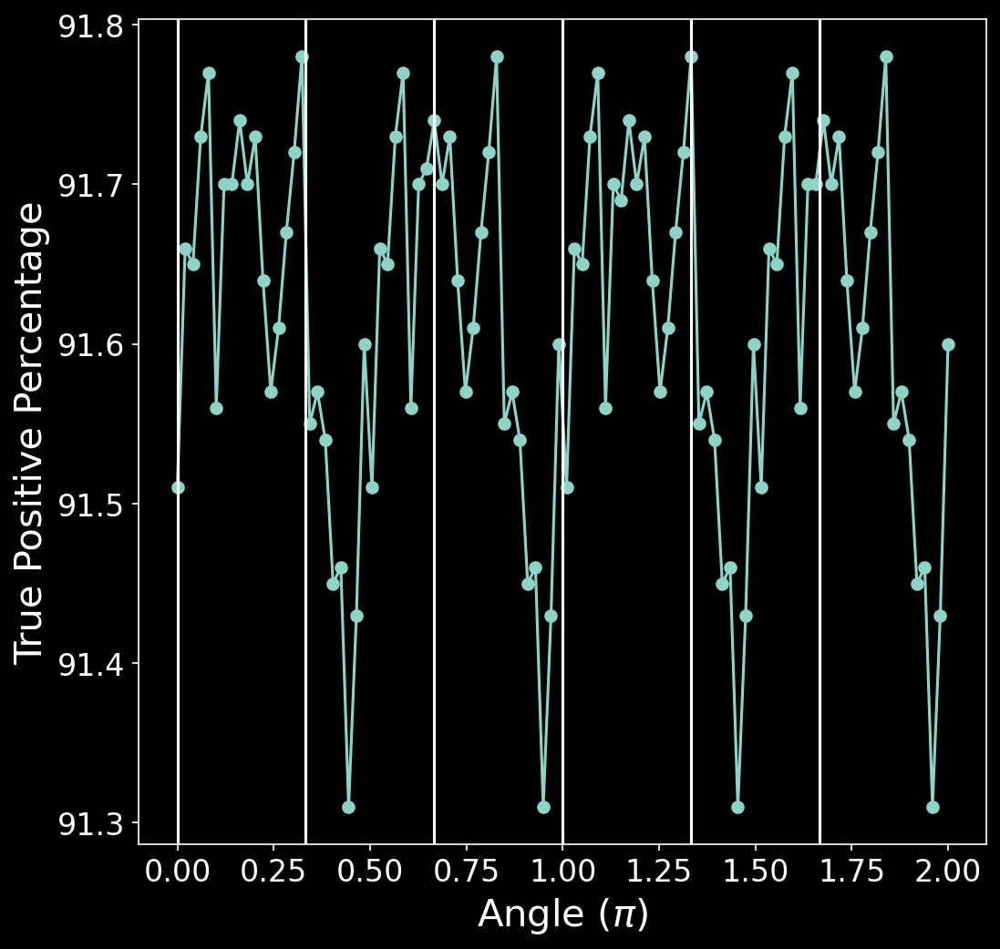

In [63]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [66]:
mnist_DHC_out_sizetrain = hd5_open('../from_cannon/2021_01_22/mnist_DHC_train_ang_0_2.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../from_cannon/2021_01_22/mnist_DHC_test_ang_0_2.h5','main/data')
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_sizetest,5,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_sizetest.shape

((1000000, 219), (1000000, 1724))

In [67]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,219)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

0.00010713359423743243

In [68]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_sizetrain,5,8), np.repeat(mnist_train_y,6))
    
prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_sizetest[i::100,:],5,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(86.67229999999999, 0.4984954463182184)

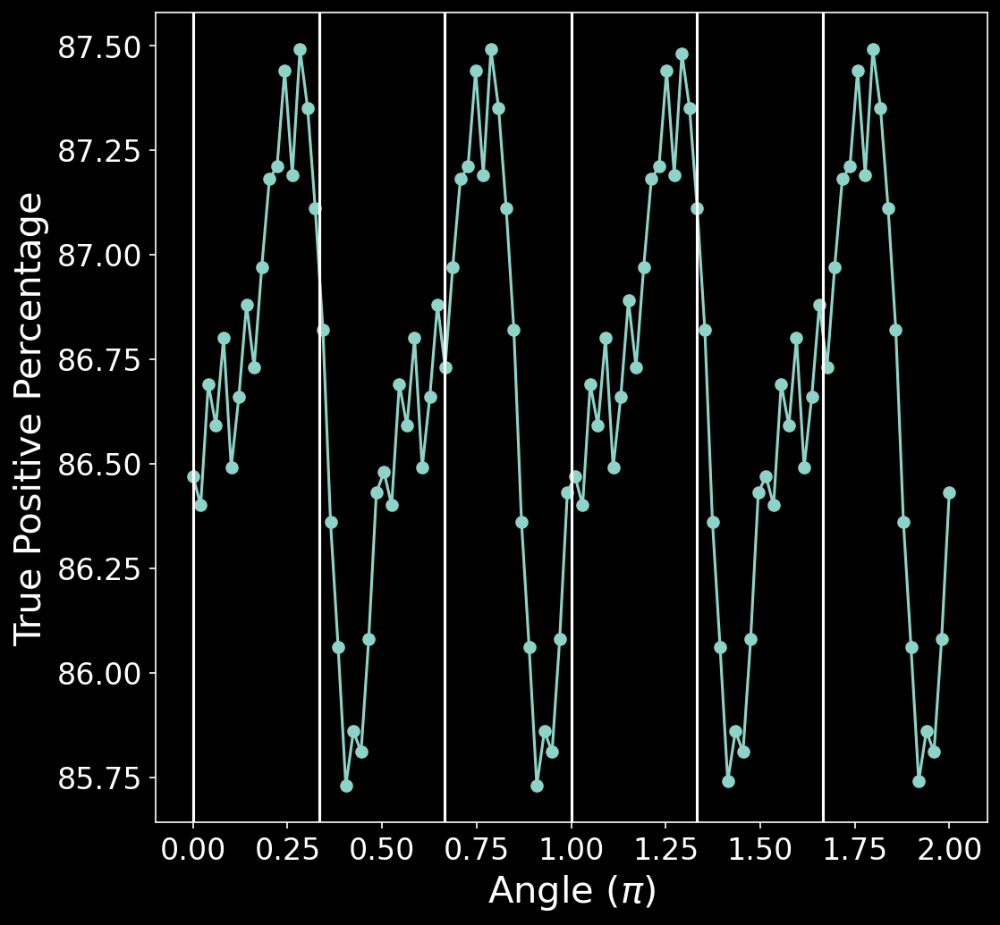

In [69]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

Try EMNIST for a sec

In [71]:
from scipy.io import loadmat

In [96]:
emnist_balanced = loadmat("/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ExtData/EMNIST/emnist-digits.mat")

In [108]:
train_y = np.ravel(emnist_balanced['dataset']['train'][0][0][0][0][1])
test_y = np.ravel(emnist_balanced['dataset']['test'][0][0][0][0][1])

In [109]:
mnist_DHC_out = hd5_open('../scratch_AKS/emnist_digits_train.h5','main/data')
mnist_DHC_out_test = hd5_open('../scratch_AKS/emnist_digits_test.h5','main/data')

In [124]:
def LDA_AKS_testman(X_train,y_train,X_test,y_test,n_components,label_list):
    lda = LDA(n_components=n_components)
    X_train = lda.fit_transform(X_train, y_train)
    y_pred = lda.predict(X_test)
    X_test = lda.transform(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    print('Accuracy' + str(prec))
    cmap_normal = (cm.T/cm.sum(axis=1)).T
    
    ## Good plots
    vmin=y_train.min()
    vmax=y_train.max()
    marker_size = 10

    from matplotlib import cm as cmplt
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    rgba_colors = [cmplt.hsv(norm(indx)) for indx, i in enumerate(label_list)]
    color_order = ["black", "white"]
    color_map = "gray"
    colormap='hsv'
    
    fig = plt.figure(figsize=(12,12),dpi=150)

    ax = fig.add_subplot(2,2,1)    
    ax.imshow(cmap_normal,
          interpolation='nearest',
          cmap=color_map,
          aspect='equal',
          vmin=0,vmax=1)

    ax.set_xticks(np.arange(cm.shape[0]))
    ax.set_yticks(np.arange(cm.shape[1]))
    
    for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
        ytick.set_color(color)

    ax.set_xticklabels(label_list)
    ax.set_yticklabels(label_list)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
             rotation_mode="anchor")
    plt.title('Test-Train Fidelity ({:.2f}%)'.format(100*prec))

    # Loop over data dimensions and create text annotations.
    textcolors=color_order
    threshold = 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] != 0:
                text = ax.text(j, i, cm[i, j],
                               ha="center", va="center", 
                               color=textcolors[int(cmap_normal[i, j] < threshold)])
    if n_components == 1:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train, y_train, s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        #ax.scatter(X_test, y_test, s=2, marker='^', zorder=10,c=y_test, cmap = 'bwr',alpha=0.5)
        sns.distplot(X_test[y_test==0],ax=ax)
        sns.distplot(X_test[y_test==1],ax=ax)
        plt.xlabel('$LDA_{}$'.format(0))
        plt.ylabel('Probability Density')
        plt.title('LDA Projection')
        
    if n_components == 2:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train[:,0], X_train[:,1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        ax.scatter(X_test[:,0], X_test[:,1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
        plt.xlabel('$LDA_{}$'.format(i-2))
        plt.ylabel('$LDA_{}$'.format(i-1))
        plt.title('LDA Projection')
    elif n_components > 2:
        for i in range(2,5):
            ax = fig.add_subplot(2,2,i)
            #ax.scatter(X_train[:,i-2], X_train[:,i-1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
            ax.scatter(X_test[:,i-2], X_test[:,i-1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
            plt.xlabel('$LDA_{}$'.format(i-2))
            plt.ylabel('$LDA_{}$'.format(i-1))
            plt.title('LDA Projection')

    fig.subplots_adjust(wspace=0.6, hspace=0.6)
    plt.show()
    
    return (lda,cm,X_train,X_test,y_train,y_test,y_pred)

Accuracy0.925575


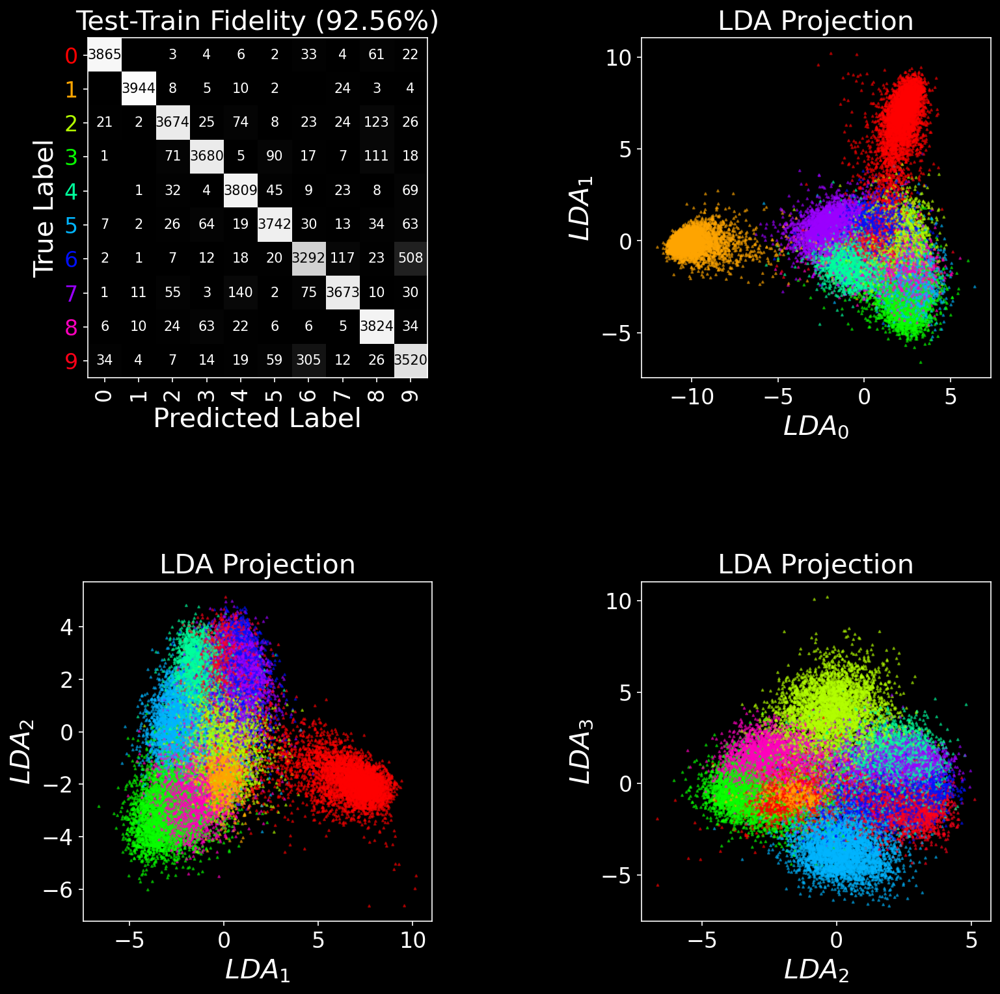

In [111]:
N = 10
labels = [0,1,2,3,4,5,6,7,8,9]
out = LDA_AKS_testman(DHC_iso(mnist_DHC_out,5,8),train_y,DHC_iso(mnist_DHC_out_test,5,8),test_y,N-1,labels)

Accuracy0.96395


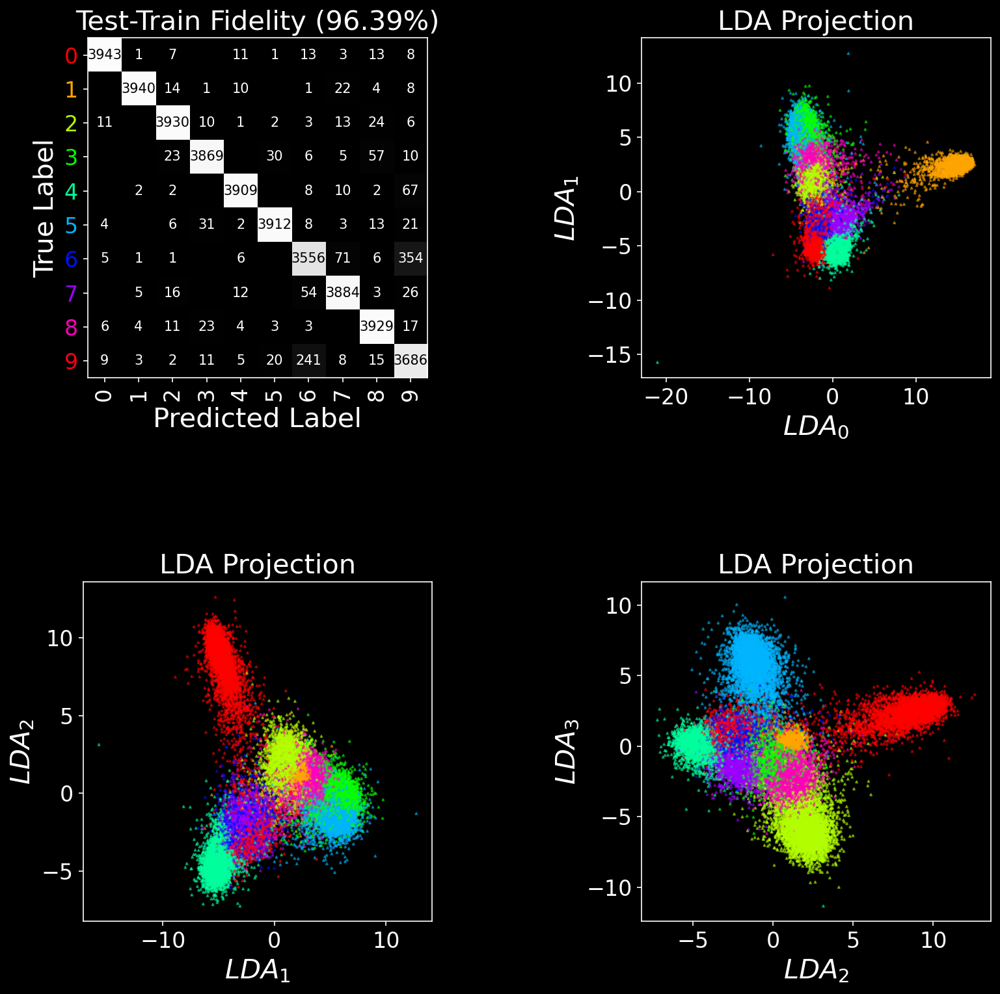

In [112]:
N = 10
labels = [0,1,2,3,4,5,6,7,8,9]
out = LDA_AKS_testman(mnist_DHC_out,train_y,mnist_DHC_out_test,test_y,N-1,labels)

In [165]:
emnist_balanced = loadmat("/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ExtData/EMNIST/emnist-letters.mat")
train_y = np.ravel(emnist_balanced['dataset']['train'][0][0][0][0][1])
test_y = np.ravel(emnist_balanced['dataset']['test'][0][0][0][0][1])
mnist_DHC_out = hd5_open('../scratch_AKS/emnist_letters_train.h5','main/data')
mnist_DHC_out_test = hd5_open('../scratch_AKS/emnist_letters_test.h5','main/data')

In [166]:
import string

In [167]:
def LDA_AKS_testman(X_train,y_train,X_test,y_test,n_components,label_list):
    lda = LDA(n_components=n_components)
    X_train = lda.fit_transform(X_train, y_train)
    y_pred = lda.predict(X_test)
    X_test = lda.transform(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    print('Accuracy' + str(prec))
    cmap_normal = (cm.T/cm.sum(axis=1)).T
    
    ## Good plots
    vmin=y_train.min()
    vmax=y_train.max()
    marker_size = 10

    from matplotlib import cm as cmplt
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    rgba_colors = [cmplt.hsv(norm(indx)) for indx, i in enumerate(label_list)]
    color_order = ["black", "white"]
    color_map = "gray"
    colormap='hsv'
    
    fig = plt.figure(figsize=(20,20),dpi=150)

    ax = fig.add_subplot(2,2,1)    
    ax.imshow(cmap_normal,
          interpolation='nearest',
          cmap=color_map,
          aspect='equal',
          vmin=0,vmax=1)

    ax.set_xticks(np.arange(cm.shape[0]))
    ax.set_yticks(np.arange(cm.shape[1]))
    
    for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
        ytick.set_color(color)

    ax.set_xticklabels(label_list)
    ax.set_yticklabels(label_list)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
             rotation_mode="anchor")
    plt.title('Test-Train Fidelity ({:.2f}%)'.format(100*prec))

    # Loop over data dimensions and create text annotations.
    textcolors=color_order
    threshold = 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] != 0:
                text = ax.text(j, i, cm[i, j],
                               ha="center", va="center", 
                               color=textcolors[int(cmap_normal[i, j] < threshold)])
    if n_components == 1:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train, y_train, s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        #ax.scatter(X_test, y_test, s=2, marker='^', zorder=10,c=y_test, cmap = 'bwr',alpha=0.5)
        sns.distplot(X_test[y_test==0],ax=ax)
        sns.distplot(X_test[y_test==1],ax=ax)
        plt.xlabel('$LDA_{}$'.format(0))
        plt.ylabel('Probability Density')
        plt.title('LDA Projection')
        
    if n_components == 2:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train[:,0], X_train[:,1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        ax.scatter(X_test[:,0], X_test[:,1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
        plt.xlabel('$LDA_{}$'.format(i-2))
        plt.ylabel('$LDA_{}$'.format(i-1))
        plt.title('LDA Projection')
    elif n_components > 2:
        for i in range(2,5):
            ax = fig.add_subplot(2,2,i)
            #ax.scatter(X_train[:,i-2], X_train[:,i-1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
            ax.scatter(X_test[:,i-2], X_test[:,i-1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
            plt.xlabel('$LDA_{}$'.format(i-2))
            plt.ylabel('$LDA_{}$'.format(i-1))
            plt.title('LDA Projection')

    fig.subplots_adjust(wspace=0.2, hspace=0.2)
    plt.show()
    
    return (lda,cm,X_train,X_test,y_train,y_test,y_pred)

Accuracy0.6961057692307693


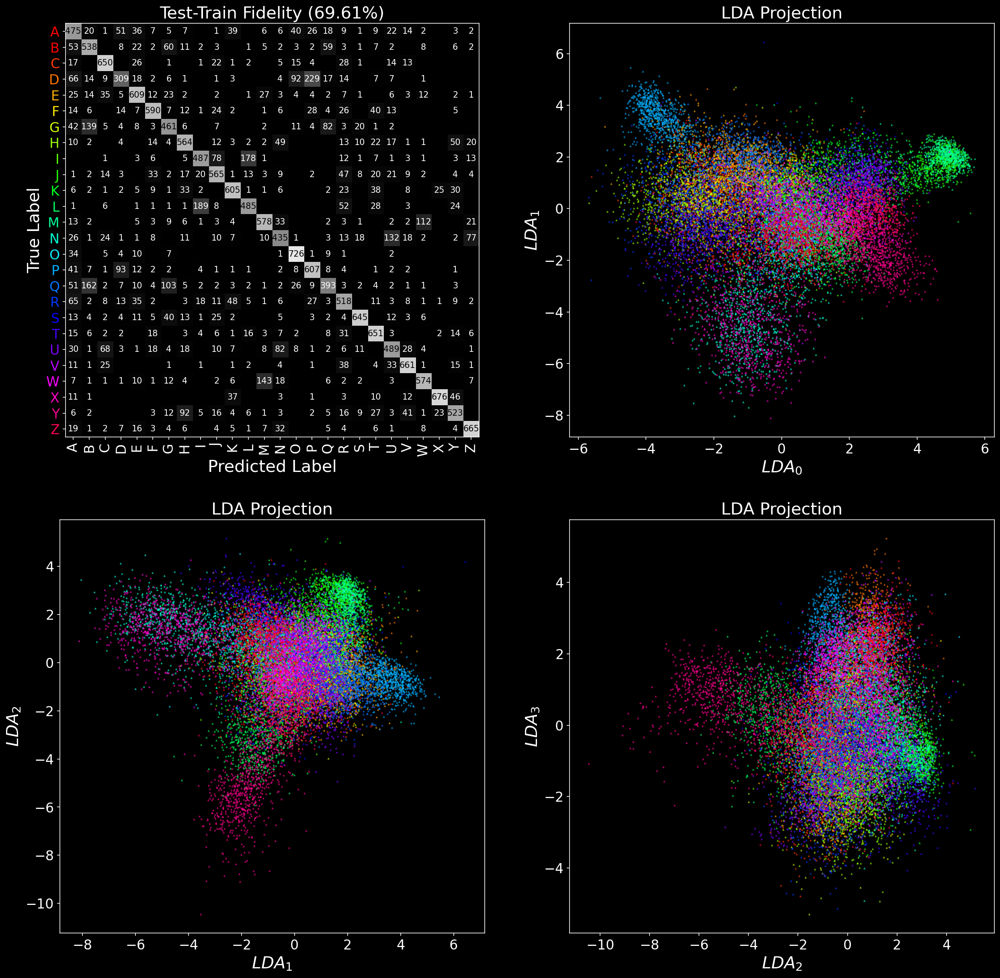

In [168]:
N = 26
labels = list(string.ascii_uppercase)
out = LDA_AKS_testman(DHC_iso(mnist_DHC_out,5,8),train_y,DHC_iso(mnist_DHC_out_test,5,8),test_y,N-1,labels)

Accuracy0.8359134615384616


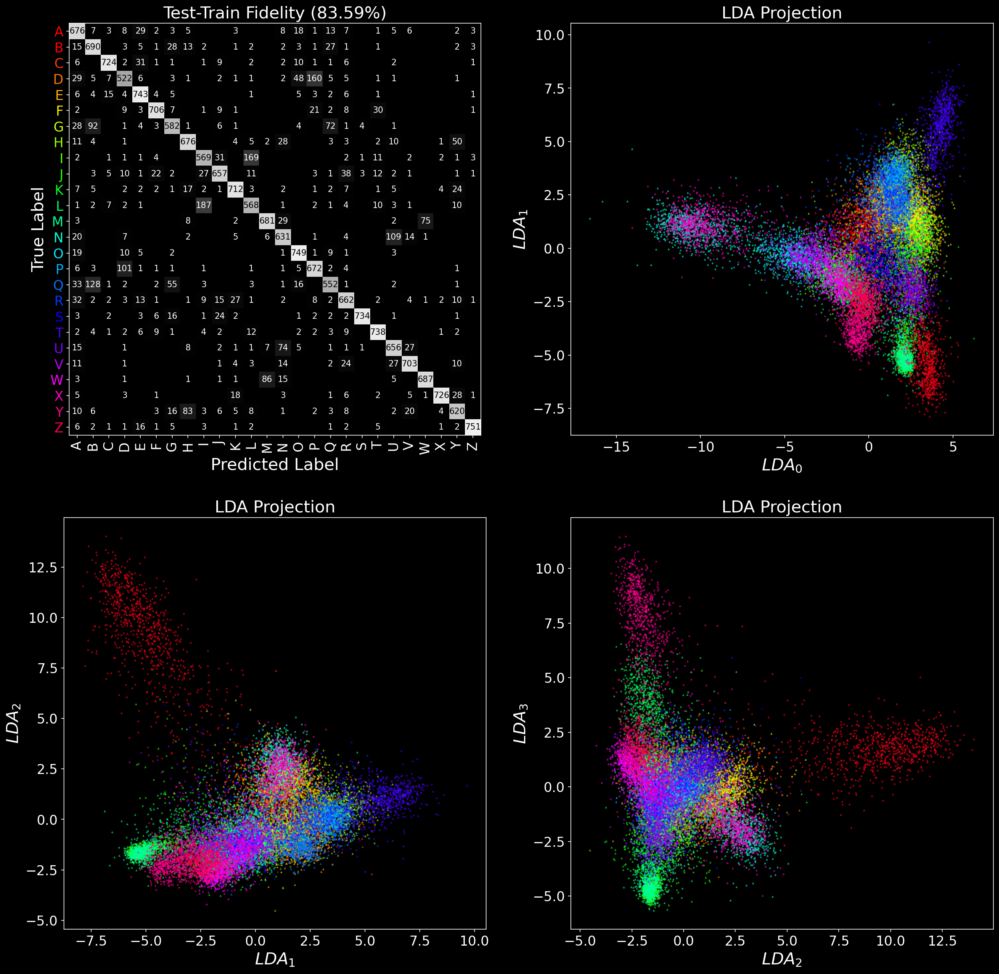

In [169]:
N = 26
labels = list(string.ascii_uppercase)
out = LDA_AKS_testman(mnist_DHC_out,train_y,mnist_DHC_out_test,test_y,N-1,labels)

In [173]:
emnist_balanced = loadmat("/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ExtData/EMNIST/emnist-balanced.mat")
train_y = np.ravel(emnist_balanced['dataset']['train'][0][0][0][0][1])
test_y = np.ravel(emnist_balanced['dataset']['test'][0][0][0][0][1])
mnist_DHC_out = hd5_open('../scratch_AKS/emnist_balanced_train.h5','main/data')
mnist_DHC_out_test = hd5_open('../scratch_AKS/emnist_balanced_test.h5','main/data')

In [174]:
labels = [0,1,2,3,4,5,6,7,8,9] + list(string.ascii_uppercase) + list(string.ascii_lowercase)
labels.remove('c')
labels.remove('i')
labels.remove('j')
labels.remove('k')
labels.remove('l')

labels.remove('m')
labels.remove('o')
labels.remove('p')
labels.remove('s')

labels.remove('u')
labels.remove('v')
labels.remove('w')
labels.remove('x')
labels.remove('y')
labels.remove('z')

In [179]:
def LDA_AKS_testman(X_train,y_train,X_test,y_test,n_components,label_list):
    lda = LDA(n_components=n_components)
    X_train = lda.fit_transform(X_train, y_train)
    y_pred = lda.predict(X_test)
    X_test = lda.transform(X_test)
    cm = confusion_matrix(y_test, y_pred)
    prec = precision_score(y_test, y_pred,average='micro')
    print('Accuracy' + str(prec))
    cmap_normal = (cm.T/cm.sum(axis=1)).T
    
    ## Good plots
    vmin=y_train.min()
    vmax=y_train.max()
    marker_size = 10

    from matplotlib import cm as cmplt
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    rgba_colors = [cmplt.hsv(norm(indx)) for indx, i in enumerate(label_list)]
    color_order = ["black", "white"]
    color_map = "gray"
    colormap='hsv'
    
    fig = plt.figure(figsize=(36,36),dpi=150)

    ax = fig.add_subplot(2,2,1)    
    ax.imshow(cmap_normal,
          interpolation='nearest',
          cmap=color_map,
          aspect='equal',
          vmin=0,vmax=1)

    ax.set_xticks(np.arange(cm.shape[0]))
    ax.set_yticks(np.arange(cm.shape[1]))
    
    for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
        ytick.set_color(color)

    ax.set_xticklabels(label_list)
    ax.set_yticklabels(label_list)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
             rotation_mode="anchor")
    plt.title('Test-Train Fidelity ({:.2f}%)'.format(100*prec))

    # Loop over data dimensions and create text annotations.
    textcolors=color_order
    threshold = 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] != 0:
                text = ax.text(j, i, cm[i, j],
                               ha="center", va="center", 
                               color=textcolors[int(cmap_normal[i, j] < threshold)])
    if n_components == 1:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train, y_train, s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        #ax.scatter(X_test, y_test, s=2, marker='^', zorder=10,c=y_test, cmap = 'bwr',alpha=0.5)
        sns.distplot(X_test[y_test==0],ax=ax)
        sns.distplot(X_test[y_test==1],ax=ax)
        plt.xlabel('$LDA_{}$'.format(0))
        plt.ylabel('Probability Density')
        plt.title('LDA Projection')
        
    if n_components == 2:
        ax = fig.add_subplot(2,2,2)
        #ax.scatter(X_train[:,0], X_train[:,1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
        ax.scatter(X_test[:,0], X_test[:,1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
        plt.xlabel('$LDA_{}$'.format(i-2))
        plt.ylabel('$LDA_{}$'.format(i-1))
        plt.title('LDA Projection')
    elif n_components > 2:
        for i in range(2,5):
            ax = fig.add_subplot(2,2,i)
            #ax.scatter(X_train[:,i-2], X_train[:,i-1], s=2, marker='o', zorder=10,c=y_train, cmap = 'bwr',alpha=0.5)
            ax.scatter(X_test[:,i-2], X_test[:,i-1], s=2, marker='^', zorder=10,c=y_test, cmap = colormap, vmin=vmin, vmax=vmax,alpha=0.5)
            plt.xlabel('$LDA_{}$'.format(i-2))
            plt.ylabel('$LDA_{}$'.format(i-1))
            plt.title('LDA Projection')

    fig.subplots_adjust(wspace=0.2, hspace=0.2)
    plt.show()
    
    return (lda,cm,X_train,X_test,y_train,y_test,y_pred)

Accuracy0.7723404255319148


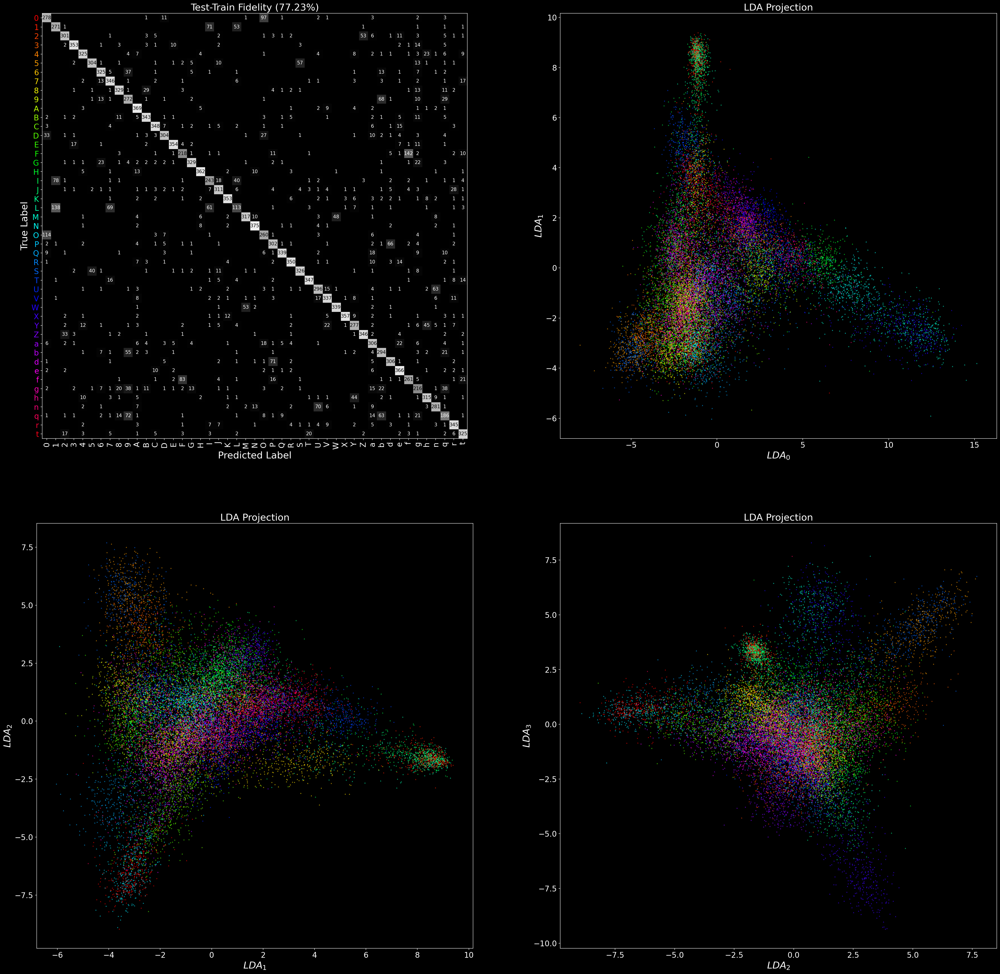

In [181]:
N = 47
out = LDA_AKS_testman(mnist_DHC_out,train_y,mnist_DHC_out_test,test_y,N-1,labels)

Accuracy0.6572340425531915


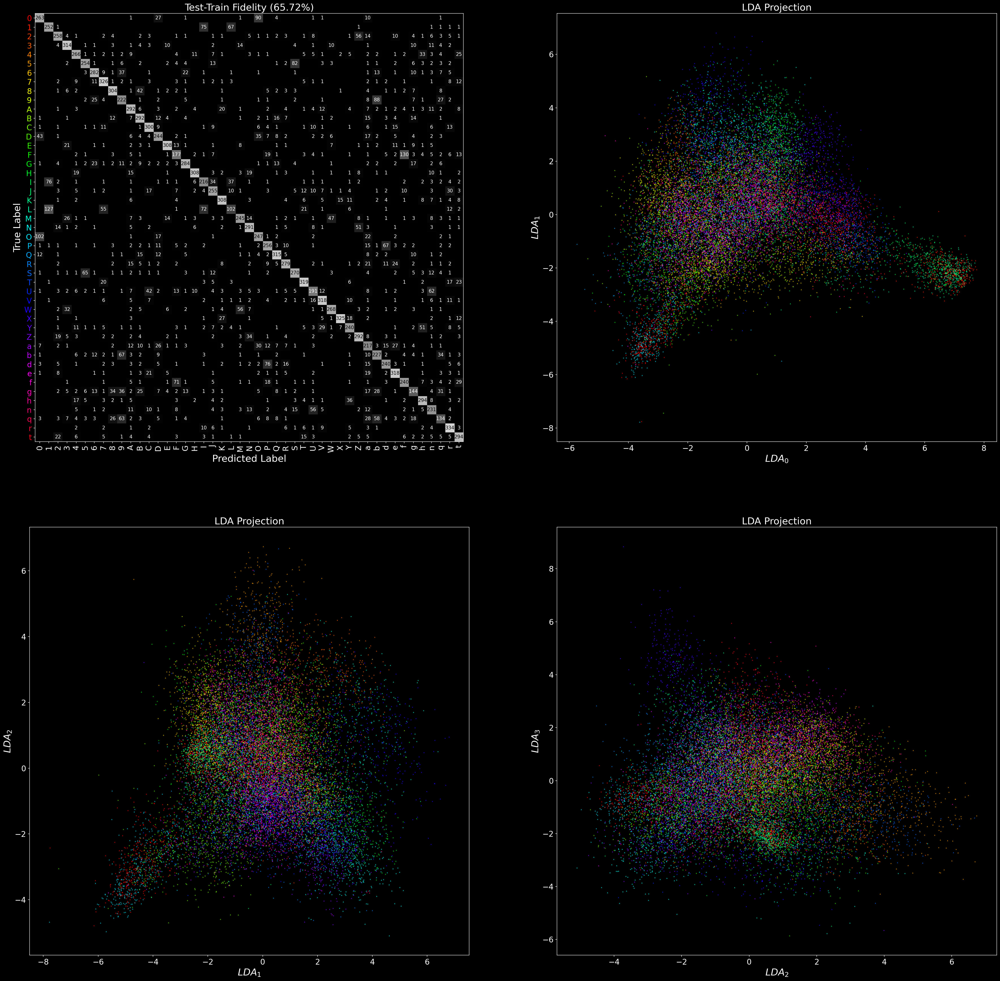

In [180]:
N = 47
out = LDA_AKS_testman(DHC_iso(mnist_DHC_out,5,8),train_y,DHC_iso(mnist_DHC_out_test,5,8),test_y,N-1,labels)

Does J2>J1 condition improve delta and or tpp stability? Hopefully does not impact the total tpp.

In [5]:
def DHC_iso(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,J*J*L),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [6]:
def DHC_iso_noj(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L)),Sphi1))

In [8]:
mnist_DHC_out = hd5_open('../scratch_AKS/mnist_DHC_out.h5','main/data')
mnist_DHC_out_test = hd5_open('../scratch_AKS/mnist_DHC_out_test.h5','main/data')

mnist_DHC_out_stack = np.vstack((mnist_DHC_out, mnist_DHC_out_rotpi_3,mnist_DHC_out_rot2pi_3,mnist_DHC_out_rot3pi_3,mnist_DHC_out_rot4pi_3,mnist_DHC_out_rot5pi_3))
mnist_DHC_out_stack_test = np.vstack((mnist_DHC_out_test, mnist_DHC_out_rotpi_3_test,mnist_DHC_out_rot2pi_3_test,mnist_DHC_out_rot3pi_3_test,mnist_DHC_out_rot4pi_3_test,mnist_DHC_out_rot5pi_3_test))

mnist_DHC_out_stack_train_y = np.hstack((mnist_train_y,mnist_train_y,mnist_train_y,mnist_train_y,mnist_train_y,mnist_train_y))
mnist_DHC_out_stack_test_y = np.hstack((mnist_test_y,mnist_test_y,mnist_test_y,mnist_test_y,mnist_test_y,mnist_test_y))

In [14]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj(mnist_DHC_out_stack,6,8), mnist_DHC_out_stack_train_y)

prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso_noj(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))

In [21]:
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(84.1716, 0.21566511076203362)

In [22]:
mnist_DHC_out_size_iso = DHC_iso_noj(mnist_DHC_out_angles,6,8)

NameError: name 'mnist_DHC_out_sizetest' is not defined

In [23]:
mnist_DHC_out_size_iso.shape, mnist_DHC_out_angles.shape

((1000000, 135), (1000000, 2452))

In [24]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,135)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

7.353260499488325e-07

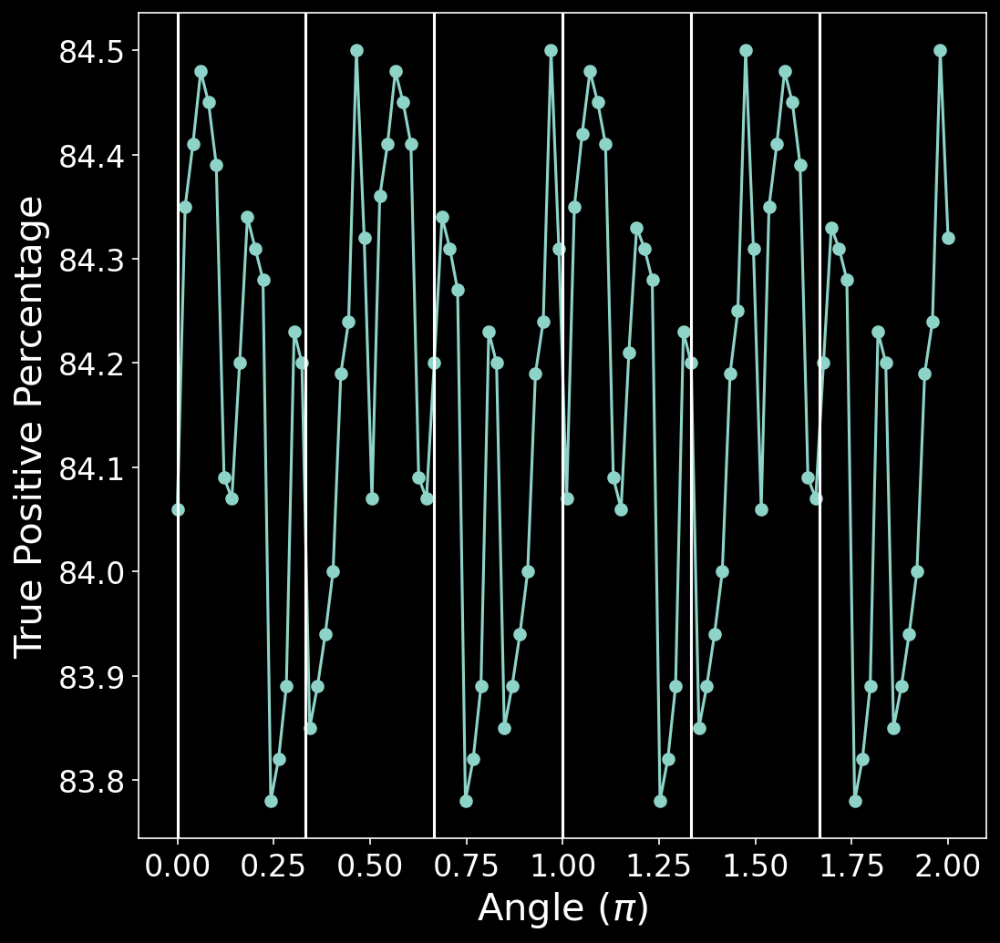

In [25]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [28]:
def DHC_iso_noj2(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.tril_indices(J,-1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L)),Sphi2))

In [39]:
mnist_DHC_out_size_iso = DHC_iso_noj2(mnist_DHC_out_angles,6,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_angles.shape

((1000000, 135), (1000000, 2452))

In [40]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,135)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

1.6238807070813845e-05

In [41]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj(mnist_DHC_out_stack,6,8), mnist_DHC_out_stack_train_y)

prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso_noj2(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))

In [42]:
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(12.053199999999997, 0.011906300852910166)

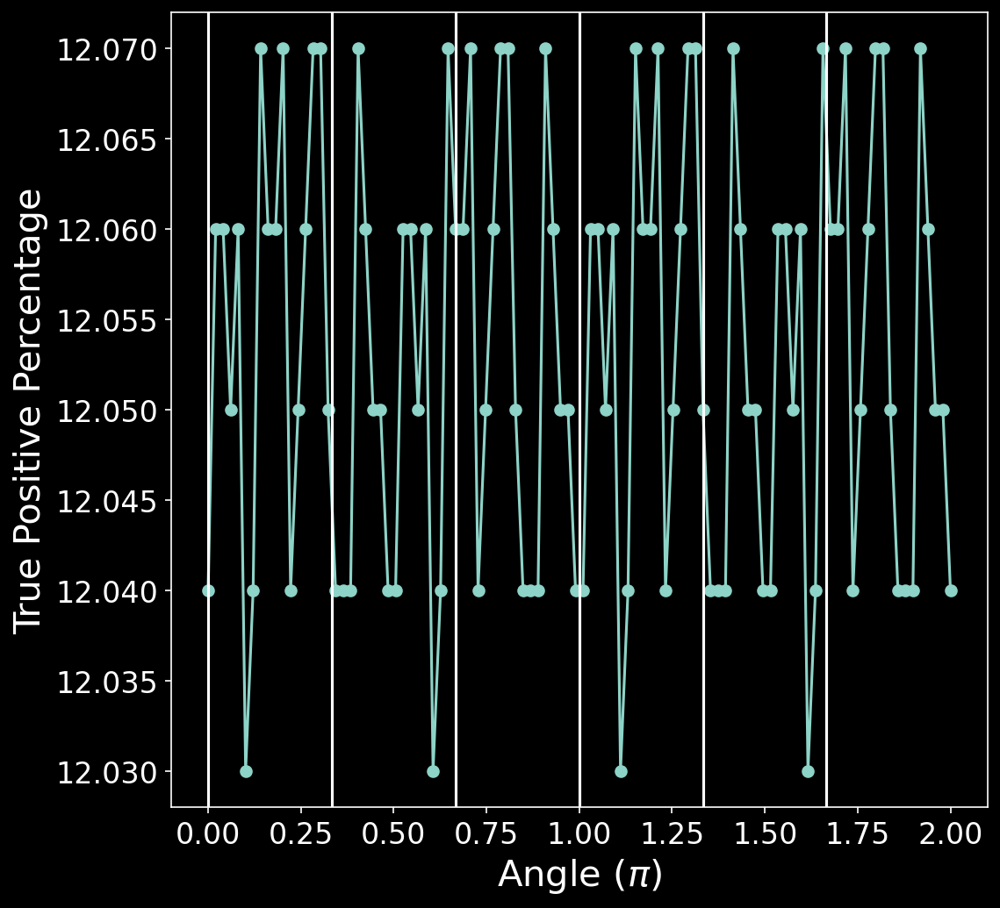

In [43]:
fig = plt.figure(figsize=(8,8),dpi=150)

ax = fig.add_subplot(111) 
ax.plot(angles,100*np.array(prec_mnist_angles), linestyle='-', marker='o')
plt.xlabel('Angle ($\pi$)')
plt.ylabel('True Positive Percentage')
plt.axvline(x=0.333)
plt.axvline(x=0.666)
plt.axvline(x=1)
plt.axvline(x=1.333)
plt.axvline(x=1.666)
plt.axvline(x=0)

In [44]:
mnist_DHC_out_size_iso = DHC_iso(mnist_DHC_out_angles,6,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_angles.shape

((1000000, 310), (1000000, 2452))

In [46]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,310)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

7.99445242119837e-06

In [48]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso(mnist_DHC_out_stack,6,8), mnist_DHC_out_stack_train_y)

prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_iso(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))

In [49]:
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(92.05920000000002, 0.11808200540302453)

In [50]:
def DHC_S1(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1)))

In [51]:
mnist_DHC_out_size_iso = DHC_S1(mnist_DHC_out_angles,6,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_angles.shape

((1000000, 9), (1000000, 2452))

In [52]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,9)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

6.8443850319948e-06

In [53]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1(mnist_DHC_out_stack,6,8), mnist_DHC_out_stack_train_y)

prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_S1(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))

In [54]:
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

(52.65120000000001, 0.03128194367362781)

In [56]:
def DHC_S1phi(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),Sphi1,Sphi2))

In [57]:
mnist_DHC_out_size_iso = DHC_S1phi(mnist_DHC_out_angles,6,8)
mnist_DHC_out_size_iso.shape, mnist_DHC_out_angles.shape

((1000000, 21), (1000000, 2452))

In [ ]:
mnist_DHC_out_size_iso_reshape = mnist_DHC_out_size_iso.reshape(10000,100,9)
angles_std = np.std(mnist_DHC_out_size_iso_reshape,axis=1)
np.mean(angles_std)

In [ ]:
prec_mnist_angles = []

N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1phi(mnist_DHC_out_stack,6,8), mnist_DHC_out_stack_train_y)

prec_mnist_angles = []
for i in range(100):
    prec_mnist_angles.append(prec_LDA(lda,DHC_S1phi(mnist_DHC_out_angles[i::100,:],6,8),mnist_test_y))
    
np.mean(100*np.array(prec_mnist_angles)), np.std(100*np.array(prec_mnist_angles))

Me revisiting this issue which scared me unecessarily due to a typo

In [9]:
mnist_DHC_out = hd5_open('../scratch_AKS/mnist_DHC_out.h5','main/data')
mnist_DHC_out_test = hd5_open('../scratch_AKS/mnist_DHC_out_test.h5','main/data')

In [10]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(mnist_DHC_out, mnist_train_y)

prec_LDA(lda,mnist_DHC_out_test,mnist_test_y)

0.9623

In [11]:
def DHC_iso_noj(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L)),Sphi1))

In [12]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_noj(mnist_DHC_out_test,6,8),mnist_test_y)

0.9114

In [32]:
def DHC_S1(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    return np.hstack((S0,S1iso))

In [34]:
N = 9
lda = LDA(n_components=N-1)
lda.fit(DHC_S1(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_S1(mnist_DHC_out_test,6,8),mnist_test_y),DHC_S1(mnist_DHC_out_test,6,8).shape

(0.5269, (10000, 8))

In [15]:
def DHC_S1phi(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1)))

In [31]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1phi(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_S1phi(mnist_DHC_out_test,6,8),mnist_test_y),DHC_S1phi(mnist_DHC_out_test,6,8).shape

(0.5274, (10000, 9))

In [19]:
def DHC_S1phi_phi1(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),Sphi1))

In [35]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1phi_phi1(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_S1phi_phi1(mnist_DHC_out_test,6,8),mnist_test_y),DHC_S1phi_phi1(mnist_DHC_out_test,6,8).shape

(0.7003, (10000, 15))

In [21]:
def DHC_S1phi_phi2(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),Sphi2))

In [36]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1phi_phi2(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_S1phi_phi2(mnist_DHC_out_test,6,8),mnist_test_y),DHC_S1phi_phi2(mnist_DHC_out_test,6,8).shape

(0.6167, (10000, 15))

In [24]:
def DHC_S1phi_phi12(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),Sphi1,Sphi2))

In [37]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_S1phi_phi12(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_S1phi_phi12(mnist_DHC_out_test,6,8),mnist_test_y),DHC_S1phi_phi12(mnist_DHC_out_test,6,8).shape

(0.7096, (10000, 21))

In [26]:
#so something is in phi2, but that info is mostly in phi1?

In [39]:
def DHC_iso_noj_nophi(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L))))

In [40]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj_nophi(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_noj_nophi(mnist_DHC_out_test,6,8),mnist_test_y),DHC_iso_noj_nophi(mnist_DHC_out_test,6,8).shape

(0.9094, (10000, 129))

In [41]:
def DHC_iso_noj(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L)),Sphi1))

In [42]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_noj(mnist_DHC_out_test,6,8),mnist_test_y),DHC_iso_noj(mnist_DHC_out_test,6,8).shape

(0.9114, (10000, 135))

In [43]:
def DHC_iso_noj_phi2(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int(J*(J-1)/2*L)),Sphi1,Sphi2))

In [44]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_noj_phi2(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_noj_phi2(mnist_DHC_out_test,6,8),mnist_test_y),DHC_iso_noj_phi2(mnist_DHC_out_test,6,8).shape

(0.9119, (10000, 141))

In [47]:
def DHC_iso_all(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    ut_ind = np.triu_indices(J,1)
    S2iso_red = np.zeros((nk,int(J*(J-1)/2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[ut_ind]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,int(J*J*L)),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [48]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_all(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_all(mnist_DHC_out_test,6,8),mnist_test_y),DHC_iso_all(mnist_DHC_out_test,6,8).shape

(0.935, (10000, 310))

In [50]:
temp = DHC_iso_all(mnist_DHC_out,6,8)
temp_test = DHC_iso_all(mnist_DHC_out_test,6,8)

In [51]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(temp, mnist_train_y)

prec_LDA(lda,temp_test,mnist_test_y)

0.935

In [69]:
a = np.arange(16).reshape(4, 4)
a

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15]])

In [62]:
il1 = np.tril_indices(4, 1)
iu1 = np.triu_indices(4, -1)

In [64]:
iu1

(array([0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 3, 3]),
 array([0, 1, 2, 3, 0, 1, 2, 3, 1, 2, 3, 2, 3]))

In [59]:
a

array([[-1, -1, -1, -1],
       [-1, -1, -1, -1],
       [ 8, -1, -1, -1],
       [12, 13, -1, -1]])

In [71]:
T = np.where(np.logical_or(np.logical_or(np.eye(4,k=-1) == 1,np.eye(4,k=1) == 1),np.eye(4,k=0) == 1))

In [72]:
T

(array([0, 0, 1, 1, 1, 2, 2, 2, 3, 3]), array([0, 1, 0, 1, 2, 1, 2, 3, 2, 3]))

In [73]:
a[T] = -1

In [74]:
a

array([[-1, -1,  2,  3],
       [-1, -1, -1,  7],
       [ 8, -1, -1, -1],
       [12, 13, -1, -1]])

In [78]:
def DHC_iso_all_diag(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.transpose(np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1))),(0,2,1))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    T = np.where(np.logical_or(np.logical_or(np.eye(J,k=-1) == 1,np.eye(J,k=1) == 1),np.eye(J,k=0) == 1))
    S2iso_red = np.zeros((nk,int(3*J-2),L))
    temp = np.zeros((J,J))
    for k in range(nk):
        for l in range(L):
            temp = S2iso[k,:,:,l]
            S2iso_red[k,:,l] = temp[T]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso_red.reshape(nk,int((3*J-2)*L)),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [79]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(DHC_iso_all_diag(mnist_DHC_out,6,8), mnist_train_y)

prec_LDA(lda,DHC_iso_all_diag(mnist_DHC_out_test,6,8),mnist_test_y),DHC_iso_all_diag(mnist_DHC_out_test,6,8).shape

(0.9146, (10000, 150))

In [84]:
mnist_DHC_out_test
idx = np.argwhere(np.all(mnist_DHC_out_test[:,...] == 0, axis=1))

In [85]:
idx

array([], shape=(0, 1), dtype=int64)

In [86]:
#Let me run a stupid test. Make sure that by adding zeros or noise, I cannot improve the test precision.

In [88]:
DHC_iso_all_diag(mnist_DHC_out_test,6,8).shape

(10000, 150)

In [96]:
zeros_check_test = np.hstack((DHC_iso_all_diag(mnist_DHC_out_test,6,8),np.zeros((10000,20))))
zeros_check_train = np.hstack((DHC_iso_all_diag(mnist_DHC_out,6,8),np.zeros((60000,20))))

In [97]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(zeros_check_train, mnist_train_y)

prec_LDA(lda,zeros_check_test,mnist_test_y),zeros_check_test.shape

(0.9146, (10000, 170))

In [103]:
np.argmax([1,1,2,2])

2

In [107]:
np.random.randn(2,2)*1e-4

array([[ 1.50569006e-05, -1.87979767e-04],
       [-5.74245896e-05, -4.83523022e-05]])

In [110]:
zeros_check_test = np.hstack((DHC_iso_all_diag(mnist_DHC_out_test,6,8),np.random.randn(10000,20)*1e-2))
zeros_check_train = np.hstack((DHC_iso_all_diag(mnist_DHC_out,6,8),np.random.randn(60000,20)*1e-2))

In [111]:
N = 10
lda = LDA(n_components=N-1)
lda.fit(zeros_check_train, mnist_train_y)

prec_LDA(lda,zeros_check_test,mnist_test_y),zeros_check_test.shape

(0.9143, (10000, 170))

In [112]:
## Try an argmin looping over N coeff to do dropout (start with ISO)

In [116]:
np.delete(zeros_check_test,169,axis=1).shape

(10000, 169)

In [132]:
mask = np.ones(170, dtype=bool)
mask[22] = False

In [134]:
zeros_check_test[:,mask].shape

(10000, 169)

In [118]:
310**2/2/3600

13.347222222222221

In [125]:
a = np.random.rand(3000, 16000)

In [126]:
%timeit a.min(axis=0)

78.5 ms ± 5 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [130]:
%timeit a.argmin(axis=0)

653 ms ± 7.16 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [129]:
example = list(a.flatten())

In [137]:
index_list = np.arange(310)

In [149]:
mask = np.ones(310, dtype=bool)
mask[22] = False
index_list[mask]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [150]:
mask_cp = copy.deepcopy(mask)

In [151]:
mask_cp[2] = False

In [153]:
mask_cp[2]

False

In [163]:
import tqdm.notebook as tq

In [ ]:
temp = DHC_iso_all(mnist_DHC_out,6,8)
temp_test = DHC_iso_all(mnist_DHC_out_test,6,8)
index_list = np.arange(310)

prec_max = []
drop_indx = []
N = 10

for i in tq.tqdm(range(309),leave=True):
    mask = np.ones(310, dtype=bool)
    mask[drop_indx] = False
    prec_temp = np.zeros(310)
    for j in tq.tqdm(index_list[mask],leave=True):
        mask_loc = copy.deepcopy(mask)
        mask_loc[j] = False
        lda = LDA(n_components=N-1)
        lda.fit(temp[:,mask_loc], mnist_train_y)
        prec_temp[j] = prec_LDA(lda,temp_test[:,mask_loc],mnist_test_y)
    
    arg = np.random.choice(np.flatnonzero(prec_temp == prec_temp.max()))
    drop_indx.append(arg)
    prec_arg = prec_temp[arg]
    prec_max.append(prec_arg)
    print(arg,prec_arg)

  0%|          | 0/309 [00:00<?, ?it/s]

  0%|          | 0/310 [00:00<?, ?it/s]

240 0.9352


  0%|          | 0/309 [00:00<?, ?it/s]

2 0.9352


  0%|          | 0/308 [00:00<?, ?it/s]

171 0.9352


  0%|          | 0/307 [00:00<?, ?it/s]

232 0.9352


  0%|          | 0/306 [00:00<?, ?it/s]

158 0.9352


  0%|          | 0/305 [00:00<?, ?it/s]

78 0.9352


  0%|          | 0/304 [00:00<?, ?it/s]

203 0.9352


  0%|          | 0/303 [00:00<?, ?it/s]

116 0.9352


  0%|          | 0/302 [00:00<?, ?it/s]

43 0.9352


  0%|          | 0/301 [00:00<?, ?it/s]

200 0.9352


  0%|          | 0/300 [00:00<?, ?it/s]

96 0.9352


  0%|          | 0/299 [00:00<?, ?it/s]

140 0.9352


  0%|          | 0/298 [00:00<?, ?it/s]

69 0.9352


  0%|          | 0/297 [00:00<?, ?it/s]

8 0.9352


  0%|          | 0/296 [00:00<?, ?it/s]

309 0.9352


  0%|          | 0/295 [00:00<?, ?it/s]

221 0.9352


  0%|          | 0/294 [00:00<?, ?it/s]

128 0.9352


  0%|          | 0/293 [00:00<?, ?it/s]

254 0.9352


  0%|          | 0/292 [00:00<?, ?it/s]

163 0.9352


  0%|          | 0/291 [00:00<?, ?it/s]

87 0.9352


  0%|          | 0/290 [00:00<?, ?it/s]

27 0.9352


  0%|          | 0/289 [00:00<?, ?it/s]

213 0.9352


  0%|          | 0/288 [00:00<?, ?it/s]

152 0.9352


  0%|          | 0/287 [00:00<?, ?it/s]

182 0.9352


  0%|          | 0/286 [00:00<?, ?it/s]

39 0.9352


  0%|          | 0/285 [00:00<?, ?it/s]

125 0.9352


  0%|          | 0/284 [00:00<?, ?it/s]

187 0.9352


  0%|          | 0/283 [00:00<?, ?it/s]

64 0.9352


  0%|          | 0/282 [00:00<?, ?it/s]

99 0.9352


  0%|          | 0/281 [00:00<?, ?it/s]

129 0.9352


  0%|          | 0/280 [00:00<?, ?it/s]

51 0.9352


  0%|          | 0/279 [00:00<?, ?it/s]

13 0.9352


  0%|          | 0/278 [00:00<?, ?it/s]

20 0.9352


  0%|          | 0/277 [00:00<?, ?it/s]

9 0.9352


  0%|          | 0/276 [00:00<?, ?it/s]

111 0.9352


  0%|          | 0/275 [00:00<?, ?it/s]

308 0.9352


  0%|          | 0/274 [00:00<?, ?it/s]

269 0.9352


  0%|          | 0/273 [00:00<?, ?it/s]

3 0.9352


  0%|          | 0/272 [00:00<?, ?it/s]

227 0.9352


  0%|          | 0/271 [00:00<?, ?it/s]

185 0.9355


  0%|          | 0/270 [00:00<?, ?it/s]

170 0.936


  0%|          | 0/269 [00:00<?, ?it/s]

94 0.9363


  0%|          | 0/268 [00:00<?, ?it/s]

276 0.9365


  0%|          | 0/267 [00:00<?, ?it/s]

45 0.9367


  0%|          | 0/266 [00:00<?, ?it/s]

41 0.9368


  0%|          | 0/265 [00:00<?, ?it/s]

29 0.9368


  0%|          | 0/264 [00:00<?, ?it/s]

306 0.9368


  0%|          | 0/263 [00:00<?, ?it/s]

305 0.9369


  0%|          | 0/262 [00:00<?, ?it/s]

261 0.9369


  0%|          | 0/261 [00:00<?, ?it/s]

285 0.9369


  0%|          | 0/260 [00:00<?, ?it/s]

5 0.9369


  0%|          | 0/259 [00:00<?, ?it/s]

299 0.937


  0%|          | 0/258 [00:00<?, ?it/s]

22 0.9371


  0%|          | 0/257 [00:00<?, ?it/s]

37 0.937


  0%|          | 0/256 [00:00<?, ?it/s]

296 0.9371


  0%|          | 0/255 [00:00<?, ?it/s]

159 0.9371


  0%|          | 0/254 [00:00<?, ?it/s]

35 0.9371


  0%|          | 0/253 [00:00<?, ?it/s]

56 0.9373


  0%|          | 0/252 [00:00<?, ?it/s]

24 0.9371


  0%|          | 0/251 [00:00<?, ?it/s]

31 0.937


  0%|          | 0/250 [00:00<?, ?it/s]

271 0.937


  0%|          | 0/249 [00:00<?, ?it/s]

292 0.937


  0%|          | 0/248 [00:00<?, ?it/s]

33 0.937


  0%|          | 0/247 [00:00<?, ?it/s]

173 0.937


  0%|          | 0/246 [00:00<?, ?it/s]

302 0.937


  0%|          | 0/245 [00:00<?, ?it/s]

208 0.937


  0%|          | 0/244 [00:00<?, ?it/s]

6 0.937


  0%|          | 0/243 [00:00<?, ?it/s]

202 0.9371


  0%|          | 0/242 [00:00<?, ?it/s]

278 0.9369


  0%|          | 0/241 [00:00<?, ?it/s]

65 0.9368


  0%|          | 0/240 [00:00<?, ?it/s]

274 0.9367


  0%|          | 0/239 [00:00<?, ?it/s]

270 0.9368


  0%|          | 0/238 [00:00<?, ?it/s]

251 0.937


  0%|          | 0/237 [00:00<?, ?it/s]

175 0.9371


  0%|          | 0/236 [00:00<?, ?it/s]

61 0.9372


  0%|          | 0/235 [00:00<?, ?it/s]

165 0.9374


  0%|          | 0/234 [00:00<?, ?it/s]

58 0.9375


  0%|          | 0/233 [00:00<?, ?it/s]

50 0.9374


  0%|          | 0/232 [00:00<?, ?it/s]

155 0.9375


  0%|          | 0/231 [00:00<?, ?it/s]

154 0.9375


  0%|          | 0/230 [00:00<?, ?it/s]

15 0.9376


  0%|          | 0/229 [00:00<?, ?it/s]

55 0.9372


  0%|          | 0/228 [00:00<?, ?it/s]

18 0.9373


  0%|          | 0/227 [00:00<?, ?it/s]

156 0.9371


  0%|          | 0/226 [00:00<?, ?it/s]

14 0.9372


  0%|          | 0/225 [00:00<?, ?it/s]

301 0.9371


  0%|          | 0/224 [00:00<?, ?it/s]

304 0.937


  0%|          | 0/223 [00:00<?, ?it/s]

293 0.9371


  0%|          | 0/222 [00:00<?, ?it/s]

303 0.9373


  0%|          | 0/221 [00:00<?, ?it/s]

103 0.9371


  0%|          | 0/220 [00:00<?, ?it/s]

247 0.9372


  0%|          | 0/219 [00:00<?, ?it/s]

57 0.937


  0%|          | 0/218 [00:00<?, ?it/s]

10 0.9368


  0%|          | 0/217 [00:00<?, ?it/s]

284 0.9372


  0%|          | 0/216 [00:00<?, ?it/s]

25 0.9375


  0%|          | 0/215 [00:00<?, ?it/s]

248 0.9375


  0%|          | 0/214 [00:00<?, ?it/s]

244 0.9376


  0%|          | 0/213 [00:00<?, ?it/s]

114 0.9374


  0%|          | 0/212 [00:00<?, ?it/s]

98 0.9375


  0%|          | 0/211 [00:00<?, ?it/s]

12 0.9373


  0%|          | 0/210 [00:00<?, ?it/s]

297 0.9374


  0%|          | 0/209 [00:00<?, ?it/s]

49 0.9374


  0%|          | 0/208 [00:00<?, ?it/s]

235 0.9376


  0%|          | 0/207 [00:00<?, ?it/s]

268 0.9376


  0%|          | 0/206 [00:00<?, ?it/s]

252 0.9377


  0%|          | 0/205 [00:00<?, ?it/s]

157 0.9377


  0%|          | 0/204 [00:00<?, ?it/s]

216 0.9378


  0%|          | 0/203 [00:00<?, ?it/s]

211 0.9376


  0%|          | 0/202 [00:00<?, ?it/s]

72 0.9377


  0%|          | 0/201 [00:00<?, ?it/s]

166 0.9376


  0%|          | 0/200 [00:00<?, ?it/s]

205 0.9373


  0%|          | 0/199 [00:00<?, ?it/s]